hotel booking demand
====================
#### https://www.kaggle.com/jessemostipak/hotel-booking-demand   
   
+ Find a problem
+ Analyze previous approaches
+ Modeling your methodolody
+ Analyzing data
+ Visualization
+ Collaborative Evaluation  
<br/>



</br>

-----------------

In [45]:
%pip install pdpbox

-----------
## 1. Packages Import


In [46]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import pycountry as pc
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import GradientBoostingClassifier 
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from catboost import CatBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier
from lightgbm import LGBMClassifier
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingClassifier
from pdpbox import pdp
pd.options.display.max_columns = None

In [47]:
## Data Loading
data = pd.read_csv('datasets/hotel_bookings.csv.zip')

### Columns descr:
- `hotel` - *(H1 = Resort Hotel or H2 = City Hotel)*
- `is_canceled` - *Value indicating if the booking was canceled (1) or not (0)*
- `lead_time` - *Number of days that elapsed between the entering date of the booking into the PMS and the arrival date*
- `arrival_date_year` - *Year of arrival date*
- `arrival_date_month` - *Month of arrival date*
- `arrival_date_week_number` - *Week number of year for arrival date*
- `arrival_date_day_of_month` - *Day of arrival date*
- `stays_in_weekend_nights` - *Number of weekend nights (Saturday or Sunday) the guest stayed or booked to stay at the hotel*
- `stays_in_week_nights` - *Number of week nights (Monday to Friday) the guest stayed or booked to stay at the hotel*
- `adults` - *Number of adults*
- `children` - *Number of children*
- `babies` - *Number of babies*
- `meal` - *Type of meal booked. Categories are presented in standard hospitality meal packages: Undefined/SC – no meal package; BB – Bed & Breakfast; HB – Half board (breakfast and one other meal – usually dinner); FB – Full board (breakfast, lunch and dinner)*
- `country` - *Country of origin. Categories are represented in the ISO 3155–3:2013 format*
- `market_segment` - *Market segment designation. In categories, the term “TA” means “Travel Agents” and “TO” means “Tour Operators”*
- `distribution_channel` - *Booking distribution channel. The term “TA” means “Travel Agents” and “TO” means “Tour Operators”*
- `is_repeated_guest` - *Value indicating if the booking name was from a repeated guest (1) or not (0)*
- `previous_cancellations` - *Number of previous bookings that were cancelled by the customer prior to the current booking*
- `previous_bookings_not_canceled` - *Number of previous bookings not cancelled by the customer prior to the current booking*
- `reserved_room_type` - *Code of room type reserved. Code is presented instead of designation for anonymity reasons.*
- `assigned_room_type` - *Code for the type of room assigned to the booking. Sometimes the assigned room type differs from the reserved room type due to hotel operation reasons (e.g. overbooking) or by customer request. Code is presented instead of designation for anonymity reasons.*
- `booking_changes` - *Number of changes/amendments made to the booking from the moment the booking was entered on the PMS until the moment of check-in or cancellation*
- `deposit_type` - *Indication on if the customer made a deposit to guarantee the booking. This variable can assume three categories: No Deposit – no deposit was made; Non Refund – a deposit was made in the value of the total stay cost; Refundable – a deposit was made with a value under the total cost of stay.*
- `agent` - *ID of the travel agency that made the booking*
- `company` - *ID of the company/entity that made the booking or responsible for paying the booking. ID is presented instead of designation for anonymity reasons*
- `days_in_waiting_list` - *Number of days the booking was in the waiting list before it was confirmed to the customer*
- `customer_type` - *Type of booking, assuming one of four categories: Contract - when the booking has an allotment or other type of contract associated to it; Group – when the booking is associated to a group; Transient – when the booking is not part of a group or contract, and is not associated to other transient booking; Transient-party – when the booking is transient, but is associated to at least other transient booking*
- `adr` - *Average Daily Rate as defined by dividing the sum of all lodging transactions by the total number of staying nights*
- `required_car_parking_spaces` - *Number of car parking spaces required by the customer*
- `total_of_special_requests` - *Number of special requests made by the customer (e.g. twin bed or high floor)*
- `reservation_status` - *Reservation last status, assuming one of three categories: Canceled – booking was canceled by the customer; Check-Out – customer has checked in but already departed; No-Show – customer did not check-in and did inform the hotel of the reason why*
- `reservation_status_date` - *Date at which the last status was set. This variable can be used in conjunction with the ReservationStatus to understand when was the booking canceled or when did the customer checked-out of the hotel*


In [48]:
## Data Check
data.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


### Market Segment Count Across Hotel

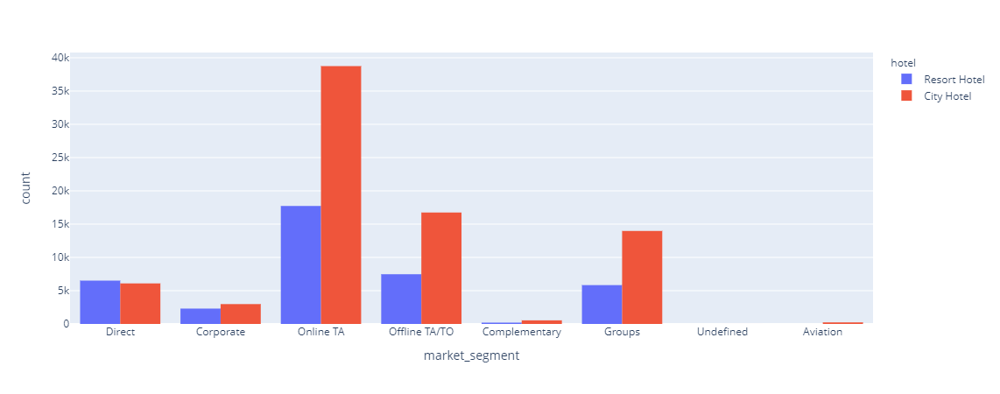

In [124]:
px.histogram(data, x='market_segment', color='hotel', barmode='group')

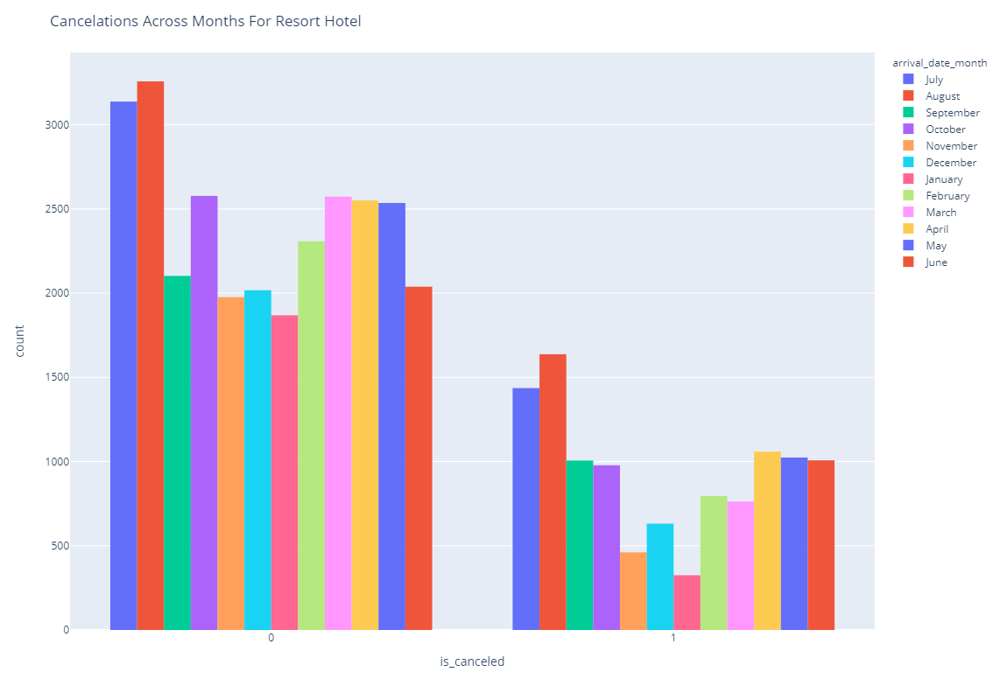

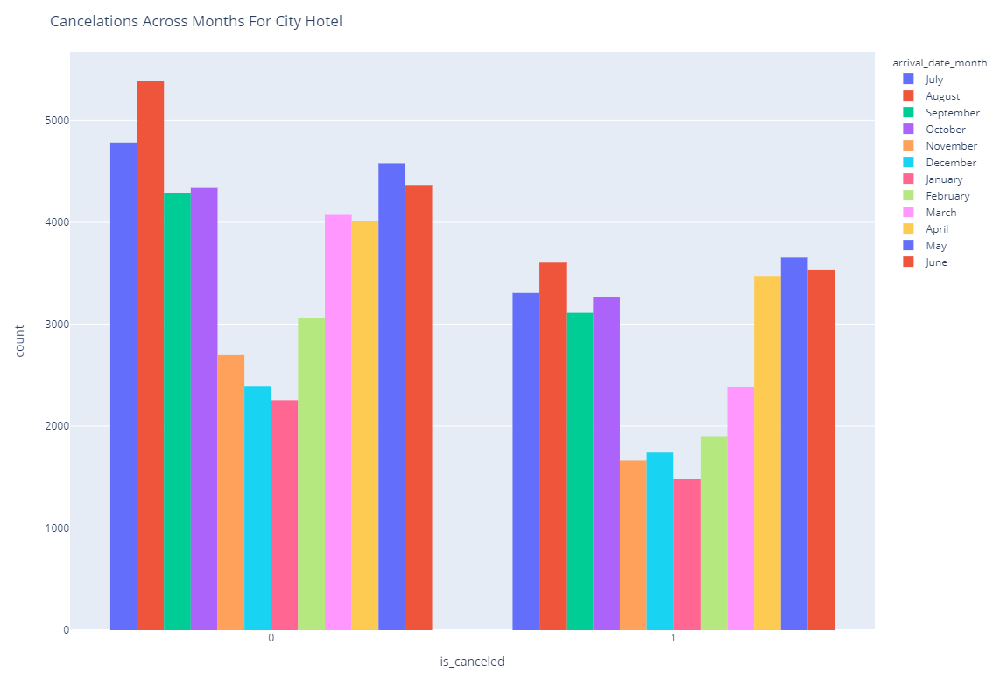

In [158]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

trace1 = px.histogram(data[data['hotel'] == 'Resort Hotel'], x='is_canceled', color='arrival_date_month', barmode='group')
trace2 = px.histogram(data[data['hotel'] == 'City Hotel'], x='is_canceled', color='arrival_date_month', barmode='group')
trace1.update_layout(
    height=800,
    title_text='Cancelations Across Months For Resort Hotel'
)
trace2.update_layout(
    height=800,
    title_text='Cancelations Across Months For City Hotel'
)
trace1.show()
trace2.show()

### Correlation heatmap

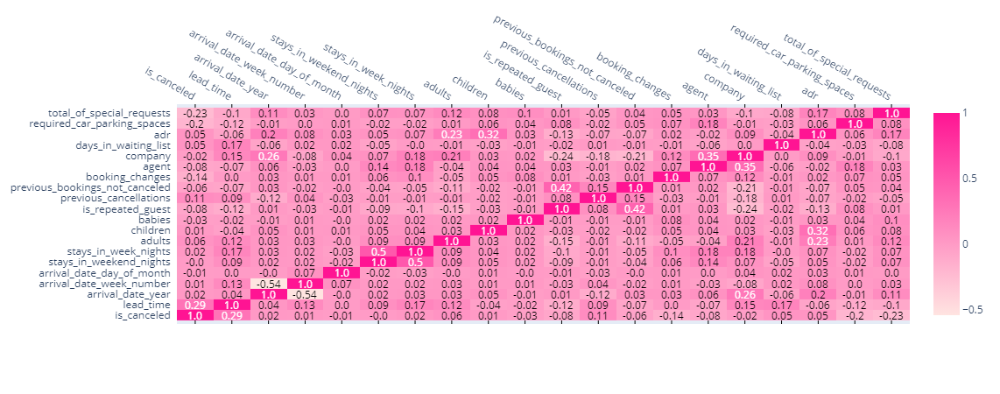

In [169]:
#!c1.8
import plotly.figure_factory as ff

corrs = data.corr()
colorscale = [[0, '#ffe4e1'], [1, '##ff1493']]
figure = ff.create_annotated_heatmap(
    z=corrs.values,
    x=list(corrs.columns),
    y=list(corrs.index),
    annotation_text=corrs.round(2).values,
    colorscale=colorscale,
    showscale=True)
figure.show()

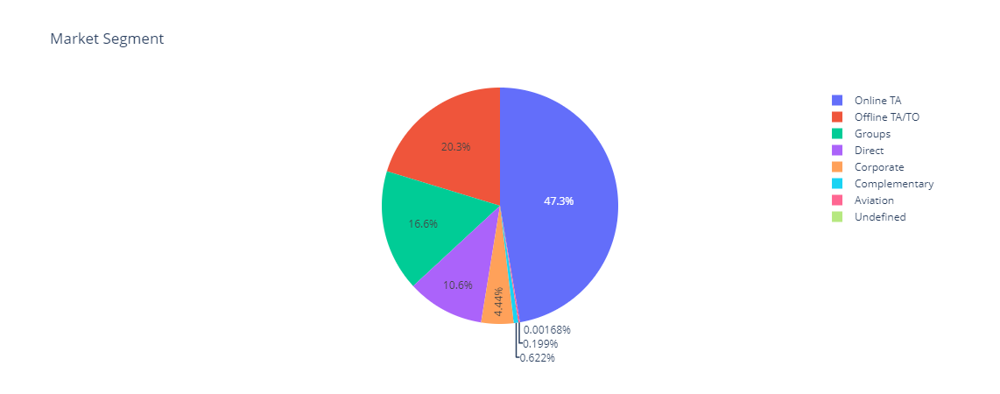

In [182]:
#!c1.8
px.pie(data_frame=data.market_segment.value_counts(),
       names=data.market_segment.value_counts().index,
       values=data.market_segment.value_counts(),
       title='Market Segment')

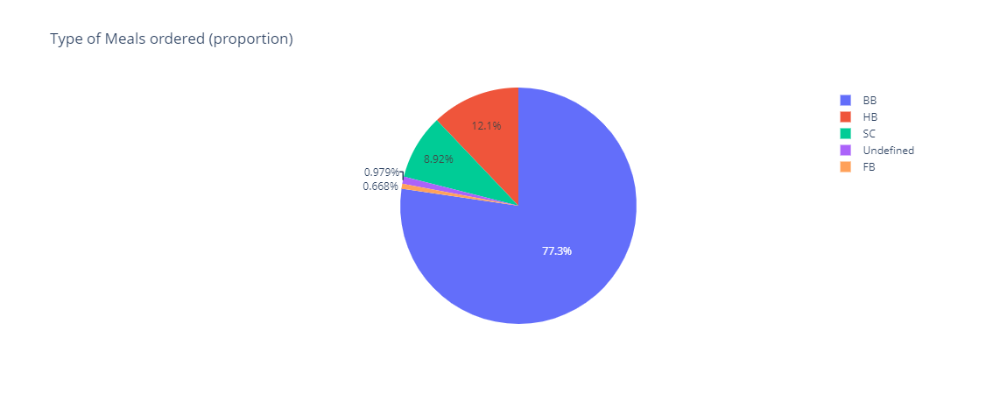

In [181]:
#!c1.8
px.pie(data_frame=data.meal.value_counts(),
       names=data.meal.value_counts().index,
       values=data.meal.value_counts(),
       title='Type of Meals ordered (proportion)')

<br/></br>


--------------
## 2. Data Pre-Processing

In [49]:
## Data Copy for Pre-Processing
df = data.copy()

In [50]:
## number of null checking
df.isnull().sum().sort_values(ascending=False)[:10]

company                   112593
agent                      16340
country                      488
children                       4
reserved_room_type             0
assigned_room_type             0
booking_changes                0
deposit_type                   0
hotel                          0
previous_cancellations         0
dtype: int64

<br/></br>

### 2-1) Dealing with Missing Value.

In [51]:
## if the value of agent, company column is null replace to 0
df[['agent','company']] = df[['agent','company']].fillna(0.0)

## if the value of country column is null replace to mode value.
df['country'].fillna(data.country.mode().to_string(), inplace=True)

In [52]:
## if the value of children column is null replace to 0
df['children']=df['children'].fillna(0.0)

## if the sum of adult, baby , child is 0 drop row.
df = df.drop(df[(df.adults+df.babies+df.children)==0].index)

In [53]:
## transfrom the datatype into int.
df[['children', 'company', 'agent']] = df[['children', 'company', 'agent']].astype('int64')

<br/></br>

### 2-2)Removing Outliers.

In [54]:
## The number of total staying night is smaller than 1 drop row.
## Create New Column.
df['total_staying_nights'] = df['stays_in_week_nights'] + df['stays_in_weekend_nights']

df = df[ df['total_staying_nights'] >= 1 ]
df = df.reset_index(drop=True)

In [55]:
## only for adr > 0 
df = df[ df['adr'] > 0 ].copy()

<br/></br>

### 2-3) Feature Creation

In [56]:
## Data Copy for new columns.
df_subset = df.copy()

In [57]:
df_subset = df_subset.drop(['reservation_status'], axis=1)

## Create [Room] column 
## if assigned room is same 1, if not0
df_subset['Room'] = 0
df_subset.loc[ df_subset['reserved_room_type'] == df_subset['assigned_room_type'] , 'Room'] = 1

## Create [more_canceled] column
## if the cancellation rate is higher  1, if not 0
df_subset['more_canceled'] = 0
df_subset.loc[ df_subset['previous_cancellations'] > df_subset['previous_bookings_not_canceled'] , 'not_canceled'] = 1

## Seperate year/month/date from reservation_status_date column
df_subset['reservation_status_date'] = pd.to_datetime(df_subset['reservation_status_date'])

df_subset['reservation_year'] = df_subset['reservation_status_date'].dt.year
df_subset['reservation_month'] = df_subset['reservation_status_date'].dt.month
df_subset['reservation_day'] = df_subset['reservation_status_date'].dt.day

## remove the leftover columns. 
df_subset = df_subset.drop(['booking_changes','assigned_room_type','reservation_status_date','distribution_channel'],axis=1)

<br/></br>

### 2-4) Encoding the  Categorical variables

In [58]:
def transform(dataframe):

    ## LabelEncoder import
    from sklearn.preprocessing import LabelEncoder
    
    le = LabelEncoder()
    categorical_features = list(dataframe.columns[dataframe.dtypes == object])
    dataframe[categorical_features]=dataframe[categorical_features].apply(lambda x: le.fit_transform(x))
    return dataframe


df_subset = transform(df_subset)

<br/></br>

### 2-5) Normalization

In [59]:
## Checking the variance
df_subset.var()

hotel                                 0.222716
is_canceled                           0.234348
lead_time                         11430.508914
arrival_date_year                     0.499289
arrival_date_month                   12.499659
arrival_date_week_number            184.281629
arrival_date_day_of_month            77.148962
stays_in_weekend_nights               0.989183
stays_in_week_nights                  3.572044
adults                                0.231569
children                              0.159791
babies                                0.009444
meal                                  1.138017
country                            2024.776043
market_segment                        1.520872
is_repeated_guest                     0.027086
previous_cancellations                0.720456
previous_bookings_not_canceled        2.091370
reserved_room_type                    2.864232
deposit_type                          0.113640
agent                             11500.539910
company      

<br/></br>

### 2-6) Select the column for normalization

In [82]:
df_subset['lead_time']=np.log1p(df_subset['lead_time'])
df_subset['agent'] = np.log1p(df_subset['agent'])
df_subset['company'] = np.log1p(df_subset['company'])
df_subset['adr'] = np.log1p(df_subset['adr'])
df_subset['country'] = np.log1p(df_subset['country'])
df_subset['days_in_waiting_list'] = np.log1p(df_subset['days_in_waiting_list'])
df_subset['reservation_month'] = np.log1p(df_subset['reservation_month'])
df_subset['reservation_day'] = np.log1p(df_subset['reservation_day'])
df_subset['arrival_date_week_number'] = np.log1p(df_subset['arrival_date_week_number'])
df_subset['arrival_date_day_of_month'] = np.log1p(df_subset['arrival_date_day_of_month'])
df_subset['arrival_date_month'] = np.log1p(df_subset['arrival_date_month'])

df_subset = df_subset.drop([])

In [83]:
## Checking the variance 
df_subset.var()

hotel                             0.222716
is_canceled                       0.234348
lead_time                         0.220228
arrival_date_year                 0.499289
arrival_date_month                0.134205
arrival_date_week_number          0.035072
arrival_date_day_of_month         0.052932
stays_in_weekend_nights           0.989183
stays_in_week_nights              3.572044
adults                            0.231569
children                          0.159791
babies                            0.009444
meal                              1.138017
country                           0.027919
market_segment                    1.520872
is_repeated_guest                 0.027086
previous_cancellations            0.720456
previous_bookings_not_canceled    2.091370
reserved_room_type                2.864232
deposit_type                      0.113640
agent                             0.355872
company                           0.163370
days_in_waiting_list              0.077978
customer_ty

<br/></br>


--------------
## 3. Modeling



### 3-1) data split

In [62]:
def data_split(df, label):
    
    from sklearn.model_selection import train_test_split

    X = df.drop(label, axis=1)
    Y = df[label]

    x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size = 0.30)
    
    return x_train, x_test, y_train, y_test


x_train, x_test, y_train, y_test = data_split(df_subset, 'is_canceled')

from sklearn.impute import SimpleImputer

## default, imputing 'mean' value
imputer = SimpleImputer()
# make X_train for PDP
X_train = x_train
# feature list
feature_names = x_train.columns
x_train = imputer.fit_transform(x_train)
x_test = imputer.transform(x_test)

<br/></br>

### 3-2) model train
+ decision tree
+ XGBoost
+ Gradient Boosting
+ AdaBoost
+ RandomForest
+ LogisticRegression
+ CatBoost
+ LGBMClassifier
+ ExtraTreesClssifier
+ HistGradientBoostingClassfier

#### Decision Tree

In [63]:
clf = DecisionTreeClassifier(random_state=0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,)
clf.fit(x_train,y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=0, splitter='best')

#### XGBoost

In [64]:
xgb = XGBClassifier(booster = 'gbtree', learning_rate = 0.1, max_depth = 5, n_estimators = 500)
xgb.fit(x_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=500, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

#### Gradient Boosting

In [65]:
gb = GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None)
gb.fit(x_train, y_train)

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

#### AdaBoost

In [66]:
ada = AdaBoostClassifier(base_estimator = clf)
ada.fit(x_train, y_train)

AdaBoostClassifier(algorithm='SAMME.R',
                   base_estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                         class_weight=None,
                                                         criterion='gini',
                                                         max_depth=None,
                                                         max_features=None,
                                                         max_leaf_nodes=None,
                                                         min_impurity_decrease=0.0,
                                                         min_impurity_split=None,
                                                         min_samples_leaf=1,
                                                         min_samples_split=2,
                                                         min_weight_fraction_leaf=0.0,
                                                         presort='deprecated',
                       

#### RandomForest

In [180]:
rd_clf = RandomForestClassifier(n_estimators=300, bootstrap=True, ccp_alpha=0.0, 
                                class_weight=None, criterion='gini', max_depth=None, 
                                max_features='auto')
rd_clf.fit(x_train, y_train)    

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=300,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

#### LogisticRegression

In [68]:
## LogisticRegression
#lr = LogisticRegression()
#lr.fit(x_train, y_train)

#### CatBoost

In [171]:
#!g2.1
cat = CatBoostClassifier(iterations=300, learning_rate=0.2041, task_type="GPU")
cat.fit(x_train, y_train, verbose = 100)

0:	learn: 0.5503603	total: 7.29ms	remaining: 2.18s
100:	learn: 0.0461456	total: 584ms	remaining: 1.15s
200:	learn: 0.0188876	total: 1.14s	remaining: 562ms
299:	learn: 0.0103969	total: 1.68s	remaining: 0us


#### LGBMClassifier

In [177]:
#!g2.1
lgbm = LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=1, max_depth=-1, device='gpu')
lgbm.fit(x_train, y_train)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               device='gpu', importance_type='split', learning_rate=1,
               max_depth=-1, min_child_samples=20, min_child_weight=0.001,
               min_split_gain=0.0, n_estimators=100, n_jobs=-1, num_leaves=31,
               objective=None, random_state=None, reg_alpha=0.0, reg_lambda=0.0,
               silent=True, subsample=1.0, subsample_for_bin=200000,
               subsample_freq=0)

#### ExtraTreesClassifier

In [173]:
etc = ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None, n_estimators=100,
                     min_impurity_decrease=0.0,)
etc.fit(x_train, y_train)

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100,
                     n_jobs=None, oob_score=False, random_state=None, verbose=0,
                     warm_start=False)

#### HistGradientBoostingClassfier

In [174]:
hgbc = HistGradientBoostingClassifier(l2_regularization=0.0, learning_rate=0.1,
                               loss='auto', max_bins=255, validation_fraction=0.1, verbose=0)
hgbc.fit(x_train,y_train)

HistGradientBoostingClassifier(l2_regularization=0.0, learning_rate=0.1,
                               loss='auto', max_bins=255, max_depth=None,
                               max_iter=100, max_leaf_nodes=31,
                               min_samples_leaf=20, n_iter_no_change=None,
                               random_state=None, scoring=None, tol=1e-07,
                               validation_fraction=0.1, verbose=0,
                               warm_start=False)

<br/></br>

### 3-3) Model Comparison

In [178]:
models = pd.DataFrame({
    'Model' : ['Decision Tree Classifier', 'Random Forest Classifier', 
               'XgBoost',  'Cat Boost', 'Gradient Boosting Classifier','Ada Boost Classifier',"LightGBMClassifier","ExtraTreesClassifier","HistGradientBoostingClassifier"],

    'Score' : [clf.score(x_test,y_test),rd_clf.score(x_test,y_test), xgb.score(x_test,y_test), cat.score(x_test,y_test) , gb.score(x_test,y_test) , ada.score(x_test,y_test) ,lgbm.score(x_test,y_test),etc.score(x_test,y_test),hgbc.score(x_test,y_test)]
})

models.sort_values(by = 'Score', ascending = False)

,Model,Score
2,XgBoost,0.999035
3,Cat Boost,0.997501
8,HistGradientBoostingClassifier,0.988018
6,LightGBMClassifier,0.962379
1,Random Forest Classifier,0.958433
7,ExtraTreesClassifier,0.958291
5,Ada Boost Classifier,0.944435
0,Decision Tree Classifier,0.944407
4,Gradient Boosting Classifier,0.926491


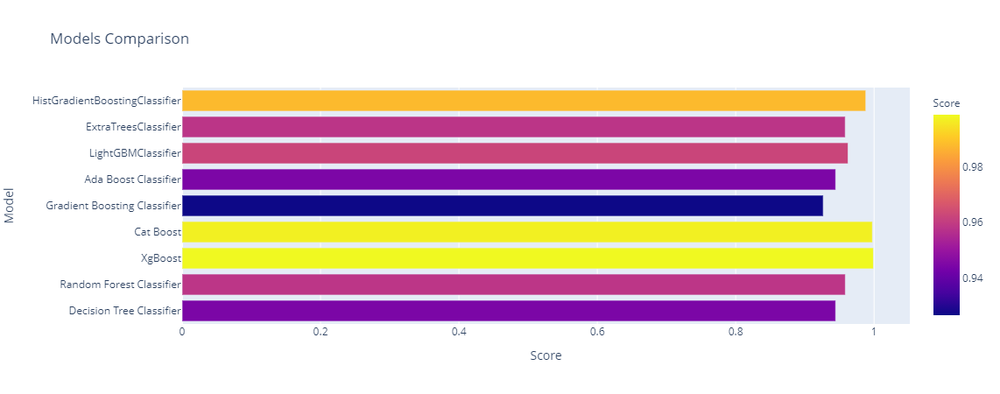

In [179]:
import plotly.express as px
px.bar(data_frame = models, x = 'Score', y = 'Model', orientation='h', color = 'Score', template = 'plotly', title = 'Models Comparison')

<br/></br>

### 3-4) ROC Curve

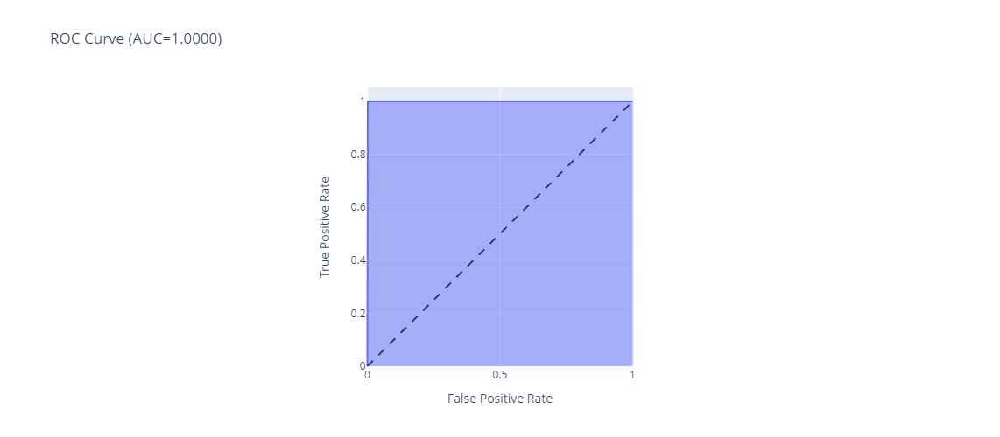

In [88]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import auc

train_score = xgb.score(x_train,y_train)
test_score = xgb.score(x_test,y_test)

y_pred = xgb.predict(x_test)
y_pred_proba_test = xgb.predict_proba(x_test)[:,1]
acc = accuracy_score(y_test, y_pred)
conf = confusion_matrix(y_test, y_pred)
final_model_report = classification_report(y_test, y_pred)

# ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba_test)

fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()

In [76]:
# AUC score
auc_score = roc_auc_score(y_test, y_pred_proba_test)
print('AUC score:', auc_score)

AUC score: 0.9999958729694509



### 3-5) Feature Importance

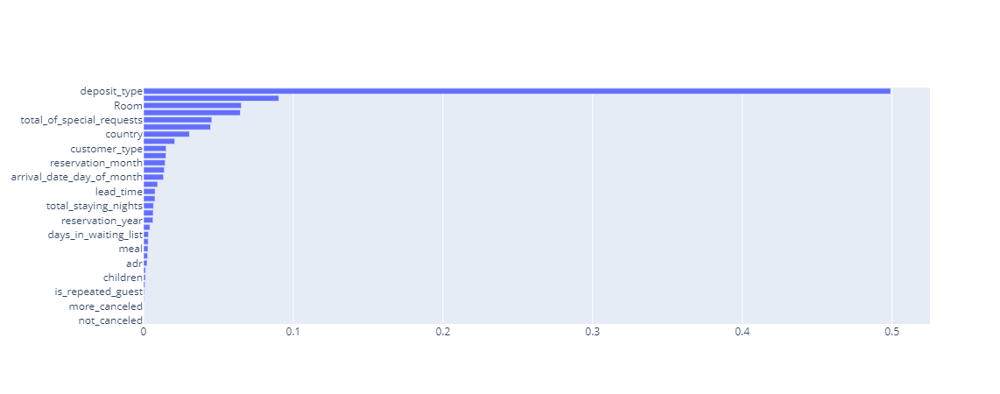

In [115]:
import plotly.graph_objects as go
feature_impt = pd.DataFrame(xgb.feature_importances_, feature_names).sort_values(by=[0],ascending=True)
# Visualization 
fig = go.Figure(go.Bar(
            x=feature_impt[0],
            y=feature_impt.index,
            orientation='h'))
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.show()